In [3]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import  seaborn as sns 
import plotly.express as ex
import matplotlib
matplotlib.use('module://matplotlib_inline.backend_inline')  

In [4]:
data = pd.read_csv("diabetes.csv")

In [5]:
df = pd.DataFrame(data=data)

In [6]:
df

,id,chol,stab.glu,hdl,ratio,glyhb,location,age,gender,height,weight,frame,bp.1s,bp.1d,bp.2s,bp.2d,waist,hip,time.ppn
0,1000,203.0,82,56.0,3.6,4.310000,Buckingham,46,female,62.0,121.0,medium,118.0,59.0,NaN,NaN,29.0,38.0,720.0
1,1001,165.0,97,24.0,6.9,4.440000,Buckingham,29,female,64.0,218.0,large,112.0,68.0,NaN,NaN,46.0,48.0,360.0
2,1002,228.0,92,37.0,6.2,4.640000,Buckingham,58,female,61.0,256.0,large,190.0,92.0,185.0,92.0,49.0,57.0,180.0
3,1003,78.0,93,12.0,6.5,4.630000,Buckingham,67,male,67.0,119.0,large,110.0,50.0,NaN,NaN,33.0,38.0,480.0
4,1005,249.0,90,28.0,8.9,7.720000,Buckingham,64,male,68.0,183.0,medium,138.0,80.0,NaN,NaN,44.0,41.0,300.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
398,41506,296.0,369,46.0,6.4,16.110001,Louisa,53,male,69.0,173.0,medium,138.0,94.0,130.0,94.0,35.0,39.0,210.0
399,41507,284.0,89,54.0,5.3,4.390000,Louisa,51,female,63.0,154.0,medium,140.0,100.0,146.0,102.0,32.0,43.0,180.0
400,41510,194.0,269,38.0,5.1,13.630000,Louisa,29,female,69.0,167.0,small,120.0,70.0,NaN,NaN,33.0,40.0,20.0
401,41752,199.0,76,52.0,3.8,4.490000,Louisa,41,female,63.0,197.0,medium,120.0,78.0,NaN,NaN,41.0,48.0,255.0


📌Explanation of the dataset columns:
1. chol: Total blood cholesterol level
2. hdl: Good cholesterol (High-density lipoprotein), low levels of which are associated with an increased risk of diabetes.
3. ratio: The ratio of total cholesterol to HDL, an indicator for measuring the risk of cardiovascular diseases.
4. stab.glu: Fasting blood sugar (Stabilized Glucose).
5. glyhb: Glycosylated Hemoglobin (HbA1c). This is the most important column for diagnosing diabetes, as it shows the average blood sugar over the past 2-3 months. Values ​​above 6.5 are usually considered diabetes.
6. height & weight: Height (inches) and weight (pounds).
7. frame: Body structure (Small, Medium, Large).
8. waist & hip: Waist and hip circumference.
9. Waist-to-hip ratio (WHR): This is obtained by dividing these two and shows the distribution of fat in the body, which is directly related to insulin resistance.
10. bp.1s / bp.1d: Systolic (top number) and diastolic (bottom number) blood pressure in the first time.
11. bp.2s / bp.2d: Systolic and diastolic blood pressure in the second time.
12. time.ppn: Postprandial time in minutes when the test was performed on the patient.
13. location: The patient's place of residence (Buckingham or Louisa).
14. age: The patient's age. One of the most important factors, because the risk of type 2 diabetes increases with age.
15. gender: The patient's gender (male/female).

In [7]:
df["Diabetes"] = (df["glyhb"] >= 6.5).astype(bool)

In [8]:
df.drop(columns="id", inplace=True)

In [9]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 403 entries, 0 to 402
Data columns (total 19 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   chol      402 non-null    float64
 1   stab.glu  403 non-null    int64  
 2   hdl       402 non-null    float64
 3   ratio     402 non-null    float64
 4   glyhb     390 non-null    float64
 5   location  403 non-null    str    
 6   age       403 non-null    int64  
 7   gender    403 non-null    str    
 8   height    398 non-null    float64
 9   weight    402 non-null    float64
 10  frame     391 non-null    str    
 11  bp.1s     398 non-null    float64
 12  bp.1d     398 non-null    float64
 13  bp.2s     141 non-null    float64
 14  bp.2d     141 non-null    float64
 15  waist     401 non-null    float64
 16  hip       401 non-null    float64
 17  time.ppn  400 non-null    float64
 18  Diabetes  403 non-null    bool   
dtypes: bool(1), float64(13), int64(2), str(3)
memory usage: 64.5 KB


In [10]:
missing_values_df = pd.DataFrame(
    data={
        "missing_values":df.isna().sum(),
        "precent_of_missing_valus":round((df.isna().mean()) * 100, 2)
    }
)

In [11]:
missing_values_df

,missing_values,precent_of_missing_valus
chol,1,0.25
stab.glu,0,0.00
hdl,1,0.25
ratio,1,0.25
glyhb,13,3.23
location,0,0.00
age,0,0.00
gender,0,0.00
height,5,1.24
weight,1,0.25


In [12]:
df.drop(columns=["bp.2s", "bp.2d"], inplace=True)

In [13]:
df.dropna(inplace=True)

In [14]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
chol,366.0,NaN,NaN,NaN,207.472678,44.03284,78.0,179.0,203.5,228.75,443.0
stab.glu,366.0,NaN,NaN,NaN,107.409836,54.106909,48.0,81.0,90.0,108.0,385.0
hdl,366.0,NaN,NaN,NaN,50.265027,17.143815,12.0,38.0,46.0,59.0,120.0
ratio,366.0,NaN,NaN,NaN,4.536339,1.759161,1.5,3.2,4.2,5.4,19.299999
glyhb,366.0,NaN,NaN,NaN,5.607295,2.231074,2.68,4.3925,4.86,5.63,16.110001
location,366,2,Louisa,191,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,366.0,NaN,NaN,NaN,46.691257,16.296744,19.0,34.0,45.0,60.0,92.0
gender,366,2,female,214,NaN,NaN,NaN,NaN,NaN,NaN,NaN
height,366.0,NaN,NaN,NaN,66.051913,3.883937,52.0,63.0,66.0,69.0,76.0
weight,366.0,NaN,NaN,NaN,178.10929,40.680567,99.0,151.0,174.0,200.0,325.0


In [15]:
df["height"] = df["height"] * 2.54
df["weight"] = df["weight"] * 0.453

In [16]:
df["Bmi"] = df["weight"] / ((df["height"]*0.01)**2)

In [17]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
chol,366.0,NaN,NaN,NaN,207.472678,44.03284,78.0,179.0,203.5,228.75,443.0
stab.glu,366.0,NaN,NaN,NaN,107.409836,54.106909,48.0,81.0,90.0,108.0,385.0
hdl,366.0,NaN,NaN,NaN,50.265027,17.143815,12.0,38.0,46.0,59.0,120.0
ratio,366.0,NaN,NaN,NaN,4.536339,1.759161,1.5,3.2,4.2,5.4,19.299999
glyhb,366.0,NaN,NaN,NaN,5.607295,2.231074,2.68,4.3925,4.86,5.63,16.110001
location,366,2,Louisa,191,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,366.0,NaN,NaN,NaN,46.691257,16.296744,19.0,34.0,45.0,60.0,92.0
gender,366,2,female,214,NaN,NaN,NaN,NaN,NaN,NaN,NaN
height,366.0,NaN,NaN,NaN,167.771858,9.865201,132.08,160.02,167.64,175.26,193.04
weight,366.0,NaN,NaN,NaN,80.683508,18.428297,44.847,68.403,78.822,90.6,147.225


In [18]:
for col in df.columns:
    print(f"unique values '{col}':\n{df[col].unique()}")
    print("_" * 80)

unique values 'chol':
[203. 165. 228.  78. 249. 248. 195. 177. 263. 242. 215. 238. 191. 213.
 255. 230. 194. 196. 186. 234. 281. 179. 232. 254. 182. 265. 199. 183.
 173. 136. 218. 225. 243. 148. 128. 169. 157. 237. 212. 233. 289. 193.
 204. 296. 178. 443. 146. 223. 171. 164. 170. 180. 209. 134. 217. 251.
 300. 189. 185. 206. 229. 159. 174. 241. 245. 143. 224. 168. 184. 158.
 214. 293. 227. 283. 273. 268. 132. 175. 181. 160. 188. 318. 192. 129.
 211. 262. 201. 219. 347. 269. 190. 236. 176. 151. 271. 118. 187. 140.
 216. 267. 246. 172. 197. 205. 235. 207. 202. 342. 155. 200. 198. 240.
 145. 266. 222. 142. 260. 208. 163. 231. 305. 149. 244. 147. 135. 138.
 152. 277. 162. 404. 239. 220. 226. 221. 166. 261. 156. 306. 150. 307.
 252. 337. 302. 279. 144. 270. 210. 301. 284.]
________________________________________________________________________________
unique values 'stab.glu':
[ 82  97  92  93  90  94  87  89 128  75  76  83  78 112  81 206  65 299
  66  80  84  72 101  85 330  86  68  52 

In [ ]:
profile = ProfileReport(df, title="Data Profiling Report", explorative=True)

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 18/18 [00:00<00:00, 179755.89it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

✅Summary of the initial EDA:
1. chol:
    - Normal distribution
    - Most data in the range 150 to 230
    - The presence of outliers in the range of less than 100 and more than 300

🏥Medical tip:
- Blood cholesterol less than 200 -> good
- Blood cholesterol between 200 and 239 -> risk
- Blood cholesterol above 240 -> dangerous

---

2. stab.glu:
    - Normal distribution with right skewness
    - The highest concentration of data is between 70 and 100
    - Has an outlier above 300

🏥Medical tip:
- Fasting blood sugar between 70 and 99 -> normal
- Fasting blood sugar between 100 and 125 -> prediabetes
- Fasting blood sugar greater than 126 -> Diabetes

---

3. hdl:
    - Normal distribution with right skewness
    - Data concentration between 30 and 45
    - Has outliers in the range below 20 and above 95

🏥Medical tip:
- High-density lipoprotein above 60 -> normal
- High-density lipoprotein between 40 and 59 (for men), between 50 and 59 (for women) -> acceptable
- High-density lipoprotein below 40 (for men), below 50 (for women) -> dangerous

---

4. ratio:
    - Normal distribution graph with right skewness and data concentration and peak uniformity between 2.5 and 5.
    - Has outliers in the range above 9

🏥Medical tip:
- Optimal/Ideal: Below 3.5:1
- Desirable/Normal: Below 5:1
- High Risk: 5:1 or higher
- Very High Risk: 10:1 or higher

---

5. glyhb:
    - Normal distribution with right skewness
    - Data concentration between 4
    - Has an outlier in the range of more than 10

🏥Medical tip:
- Normal: Below 5.7%
- Prediabetes: 5.7% to 6.4%
- Diabetes: 6.5% or higher

---

6. Location:
    - Louisa is a little older than Buckingham

---

7. age:
    - Follows a uniform distribution with a few high peaks
    - Has outliers in the range of more than 85

---

9. gender:
    - The number of women is about 1.4 times that of men

---

10. height:
    - Normal distribution with left skewness and 1 peak in the interval 175
    - Has outliers in the range of less than 150

---

11. weight:
    - Normal distribution with a slight skew to the right and a few peaks
    - Has outliers in the range of more than 130

---

12. frame:
    - Medium has the highest number in the data

---


13. bp.1s:
    - Normal distribution with a slight skew to the right and a few peaks in the range of 110 to 150
    - Has outliers in the range above 190

🏥Medical tip:
- Low -> Below 90
- Normal -> Below 120
- Elevated -> 120 to 129
- Stage 1 hypertension -> 130 to 139
- Stage 2 hypertension -> 140 or higher
- Hypertensive crisis (urgency or emergency) -> 180 or higher

---

14. bp.1d:
    - Normal distribution with very little left skew and a few peaks between 80 and 90
    - Has an outlier in the range of greater than 110 and less than 55

🏥Medical tip:
- low -> Below 60
- Normal -> Below 80
- Elevated -> Below 80
- Stage 1 hypertension -> 80 to 89
- Stage 2 hypertension -> 90 or higher
Hypertensive crisis (urgency or emergency) -> 120 or higher

---

15. waist:
    - Has a normal distribution with a skewness to the right and data concentration between 30 and 40
    - Has an outlier at point 55

---

16. hip:
    - Has a normal distribution with a slight skew to the right
    - Has outliers in the range of more than 60

---

17. time.ppn:
    - Almost normal distribution with a strong right skew and several peaks between 0 and 100 and at the point 700
    - Has outliers in the range of more than 1000

---

18. Diabetes:
    - Imbalance between class 0 and 1

In [20]:
%matplotlib inline

# EDA Part Two

## age vs chol

In [21]:
fig = ex.scatter(
    data_frame=df,
    x="age",
    y="chol",
    color="Diabetes",
    size_max=40,
    color_discrete_sequence=ex.colors.qualitative.Plotly,
)


fig.update_traces(marker=dict(size=17, opacity=0.8, line=dict(width=1)))

fig.update_layout(
    title="The relationship between age and blood cholesterol with the impact of diabetes",
    width=1400,
    height=700,
    title_font_size=22,
    xaxis_title="age",
    yaxis_title="chol",
    font=dict(size=17),
    title_x=0.5,
)
fig.add_shape(
    type="line",
    x0=0,
    x1=1,
    y0=200,
    y1=200,
    xref="paper",
    yref="y",
    line=dict(color="red", width=2, dash="dash"),
)
fig.add_annotation(
    x=15,
    y=120,
    text="Normal(200<)",
    showarrow=False,
    font=dict(size=16, color="green"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hline(y=240, line_dash="dash", line_color="red")
fig.add_annotation(
    x=15,
    y=340,
    text="Danger(240>)",
    showarrow=False,
    font=dict(size=16, color="red"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_annotation(
    x=15,
    y=220,
    text="risk(200-239)",
    showarrow=False,
    font=dict(size=14, color="#FFD900"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hrect(y0=50, y1=200, fillcolor="green", opacity=0.15)
fig.add_hrect(y0=200, y1=240, fillcolor="yellow", opacity=0.15)
fig.add_hrect(y0=240, y1=470, fillcolor="red", opacity=0.15)

fig.show()

In [ ]:
fig = ex.scatter(
    data_frame=df,
    x="age",
    y="chol",
    color="Diabetes",
    size_max=40,
    color_discrete_sequence=ex.colors.qualitative.Plotly,
)


fig.update_traces(marker=dict(size=17, opacity=0.8, line=dict(width=1)))

fig.update_layout(
    title="The relationship between age and blood cholesterol with the impact of diabetes",
    width=1400,
    height=700,
    title_font_size=22,
    xaxis_title="age",
    yaxis_title="chol",
    font=dict(size=17),
    title_x=0.5,
)
fig.add_shape(
    type="line",
    x0=0,
    x1=1,
    y0=200,
    y1=200,
    xref="paper",
    yref="y",
    line=dict(color="red", width=2, dash="dash"),
)
fig.add_annotation(
    x=15,
    y=120,
    text="Normal(200<)",
    showarrow=False,
    font=dict(size=16, color="green"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hline(y=240, line_dash="dash", line_color="red")
fig.add_annotation(
    x=15,
    y=340,
    text="Danger(240>)",
    showarrow=False,
    font=dict(size=16, color="red"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_annotation(
    x=15,
    y=220,
    text="risk(200-239)",
    showarrow=False,
    font=dict(size=14, color="#FFD900"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hrect(y0=50, y1=200, fillcolor="green", opacity=0.15)
fig.add_hrect(y0=200, y1=240, fillcolor="yellow", opacity=0.15)
fig.add_hrect(y0=240, y1=470, fillcolor="red", opacity=0.15)

fig.show()

✅ Chart analysis:
A clear pattern is seen: with increasing age, the number of people with diabetes increases
📌 This means that the **risk of developing diabetes increases with increasing age**

---

📌The cholesterol feature has no significant relationship with diabetes, because we have diabetes in all diseases.

## age vs hdl

In [22]:
fig = ex.scatter(
    data_frame=df,
    x="age",
    y="hdl",
    color="Diabetes",
    size_max=40,
    color_discrete_sequence=ex.colors.qualitative.Plotly,
)


fig.update_traces(marker=dict(size=17, opacity=0.8, line=dict(width=1)))

fig.update_layout(
    title="The relationship between age and blood cholesterol with the impact of diabetes",
    width=1400,
    height=700,
    title_font_size=22,
    xaxis_title="age",
    yaxis_title="hdl",
    font=dict(size=17),
    title_x=0.5,
)
stats_text = ""

group_stats = {}

for label, group in df.groupby("Diabetes"):

    n = len(group)
    corr = group["age"].corr(group["hdl"])
    mean_hdl = group["hdl"].mean()
    std_hdl = group["hdl"].std()
    # Calculate the percentage of people who are in the Risk range (hdl<40)
    high_risk_pct = (group["hdl"] < 40).mean() * 100

    group_stats[label] = mean_hdl

    stats_text += (
        f"<b>Diabetes={label}</b><br>"
        f"n: {n}<br>"
        f"Correlation: {corr:.2f}<br>"
        f"Mean hdl: {mean_hdl:.2f}<br>"
        f"Std: {std_hdl:.2f}<br>"
        f"% Risk (<40): {high_risk_pct:.1f}%<br>"
        f"------------------------<br>"
    )

# This part is calculating the "mean difference between two groups"
if len(group_stats) == 2:
    labels = list(group_stats.keys())
    delta = group_stats[labels[1]] - group_stats[labels[0]]
    stats_text += f"<b>ΔMean hdl:</b> {delta:.2f}<br><br>"

fig.add_annotation(
    xref="paper",
    yref="paper",
    x=1.01,
    y=0.83,
    xanchor="left",
    yanchor="top",
    showarrow=False,
    align="left",
    text=stats_text,
    bordercolor="rgba(0,0,0,0.4)",
    borderwidth=1,
    borderpad=8,
    bgcolor="rgba(255,255,255,0.95)",
    font=dict(size=14),
)
fig.update_layout(
    margin=dict(r=200),
)

fig.add_hline(y=60, line_dash="dash", line_color="red")
fig.add_annotation(
    x=10,
    y=80,
    text=f"normal(hdl>60)",
    showarrow=False,
    font=dict(size=15, color="green"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hline(y=40, line_dash="dash", line_color="red")
fig.add_annotation(
    x=10,
    y=50,
    text="Acceptable:<br>40–59 (men)<br>50–59 (women)",
    showarrow=False,
    font=dict(size=15, color="#FFD900"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_annotation(
    x=10,
    y=25,
    text="Risk:<br>Below 40 (men)<br>Below 50 (women)",
    showarrow=False,
    font=dict(size=15, color="#FF0000"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hrect(y0=0, y1=40, fillcolor="red", opacity=0.15)
fig.add_hrect(y0=40, y1=60, fillcolor="yellow", opacity=0.15)
fig.add_hrect(y0=60, y1=130, fillcolor="green", opacity=0.15)
fig.show()

✅Chart analysis:

The pattern that the graph shows is that HDL below 60 increases the risk of diabetes.<br>
**This suggests that HDL is an important factor in predicting diabetes**.

In [23]:
fig = ex.scatter(
    data_frame=df,
    x="age",
    y="hdl",
    color="gender",
    size_max=40,
    color_discrete_sequence=ex.colors.qualitative.Plotly,
)


fig.update_traces(marker=dict(size=17, opacity=0.8, line=dict(width=1)))

fig.update_layout(
    title="Relationship between age and HDL with gender effects",
    width=1400,
    height=700,
    title_font_size=22,
    xaxis_title="age",
    yaxis_title="hdl",
    font=dict(size=17),
    title_x=0.5,
)

fig.add_hline(y=60, line_dash="dash", line_color="red")
fig.add_annotation(
    x=10,
    y=80,
    text=f"normal(hdl>60)",
    showarrow=False,
    font=dict(size=15, color="green"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hline(y=40, line_dash="dash", line_color="red")
fig.add_annotation(
    x=10,
    y=50,
    text="Acceptable:<br>40–59 (men)<br>50–59 (women)",
    showarrow=False,
    font=dict(size=15, color="#FFD900"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_annotation(
    x=10,
    y=25,
    text="Risk:<br>Below 40 (men)<br>Below 50 (women)",
    showarrow=False,
    font=dict(size=15, color="#FF0000"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hrect(y0=0, y1=40, fillcolor="red", opacity=0.15)
fig.add_hrect(y0=40, y1=60, fillcolor="yellow", opacity=0.15)
fig.add_hrect(y0=60, y1=130, fillcolor="green", opacity=0.15)
fig.show()

In [ ]:
df_db_gender = (
    df.groupby("Diabetes")["gender"]
      .value_counts()
      .reset_index(name="count")
)
fig = ex.pie(
    df_db_gender,
    names="gender",
    values="count",
    facet_col="Diabetes",
    hole=0.5  
)
fig.update_layout(
    title="Relationship between age and HDL with gender effects",
    width=1400,
    height=700,
    title_font_size=20,
    title_x=0.5,
)
fig.update_traces(textinfo="percent+label")
fig.show()

✅Chart analysis:

📌Among those with diabetes, women are about 1.2 times more likely to be affected than men

📌Among those without diabetes, women are about 1.4 times more likely to be affected than men

📌This shows that diabetes does not discriminate between men and women. Based on other features, both men and women will be affected if their risk exceeds a certain threshold.

In [ ]:
df_db_gender

,Diabetes,gender,count
0,False,female,180
1,False,male,125
2,True,female,34
3,True,male,27


In [ ]:
fig = ex.scatter(
    data_frame=df,
    x="age",
    y="ratio",
    color="Diabetes",
    size_max=40,
    color_discrete_sequence=ex.colors.qualitative.Plotly,
    hover_data={"Outlier": df["ratio"].apply(lambda x: "Yes" if x > 15 else "No")},
)
fig.update_traces(marker=dict(size=17, opacity=0.75, line=dict(width=1)))
fig.update_layout(
    title="Age vs Cholesterol/HDL Ratio by Diabetes Status",
    width=1400,
    height=700,
    title_font_size=18,
    xaxis_title="age",
    yaxis_title="ratio",
    font=dict(size=17),
    title_x=0.5,
)

fig.add_hline(y=3.5, line_dash="dash", line_color="red")
fig.add_hline(y=5, line_dash="dash", line_color="red")
fig.add_hline(y=10, line_dash="dash", line_color="red")
fig.add_annotation(
    x=9,
    y=2,
    text="Optimal(3.5<ratio)",
    showarrow=False,
    font=dict(size=16, color="#4AD916"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_annotation(
    x=9,
    y=4.3,
    text="Normal(3.5-5)",
    showarrow=False,
    font=dict(size=16, color="#95FF00"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_annotation(
    x=9,
    y=7,
    text="High risk(5-10)",
    showarrow=False,
    font=dict(size=16, color="#FFD900"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_annotation(
    x=10,
    y=12,
    text="very high risk(above 10)",
    showarrow=False,
    font=dict(size=15, color="#FF0000"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hrect(y0=0, y1=5, fillcolor="green", opacity=0.15)
fig.add_hrect(y0=5, y1=10, fillcolor="yellow", opacity=0.15)
fig.add_hrect(y0=10, y1=22, fillcolor="red", opacity=0.15)

stats_text = ""

group_stats = {}

for label, group in df.groupby("Diabetes"):

    n = len(group)
    corr = group["age"].corr(group["ratio"])
    mean_ratio = group["ratio"].mean()
    std_ratio = group["ratio"].std()
    # Calculate the percentage of people who are in the High Risk range (ratio ≥ 5)
    high_risk_pct = (group["ratio"] >= 5).mean() * 100

    group_stats[label] = mean_ratio

    stats_text += (
        f"<b>Diabetes={label}</b><br>"
        f"n: {n}<br>"
        f"Correlation: {corr:.2f}<br>"
        f"Mean Ratio: {mean_ratio:.2f}<br>"
        f"Std: {std_ratio:.2f}<br>"
        f"% Risk (≥5): {high_risk_pct:.1f}%<br><br>"
    )

# This part is calculating the "mean difference between two groups"
if len(group_stats) == 2:
    labels = list(group_stats.keys())
    delta = group_stats[labels[1]] - group_stats[labels[0]]
    stats_text += f"<b>ΔMean Ratio:</b> {delta:.2f}<br><br>"

fig.add_annotation(
    xref="paper",
    yref="paper",
    x=1.01,
    y=0.83,
    xanchor="left",
    yanchor="top",
    showarrow=False,
    align="left",
    text=stats_text,
    bordercolor="rgba(0,0,0,0.4)",
    borderwidth=1,
    borderpad=8,
    bgcolor="rgba(255,255,255,0.95)",
    font=dict(size=14),
)

fig.update_layout(
    margin=dict(r=225),
)

fig.show()

✅Chart analysis:
The graph shows that those with a **total cholesterol to HDL ratio above 5 are at risk of diabetes**.

In [ ]:
fig = ex.scatter(
    data_frame=df,
    x="age",
    y="stab.glu",
    color="Diabetes",
    size_max=40,
    color_discrete_sequence=ex.colors.qualitative.Plotly,
)


fig.update_traces(marker=dict(size=17, opacity=0.8, line=dict(width=1)))

fig.update_layout(
    title="Age vs Fasting blood sugar by Diabetes Status",
    width=1400,
    height=700,
    title_font_size=22,
    xaxis_title="age",
    yaxis_title="Fasting blood sugar",
    font=dict(size=17),
    title_x=0.5,
)

fig.add_hline(y=99, line_dash="dash", line_color="red")
fig.add_annotation(
    x=10,
    y=60,
    text=f"normal(<100)",
    showarrow=False,
    font=dict(size=15, color="green"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hline(y=125, line_dash="dash", line_color="red")
fig.add_annotation(
    x=10,
    y=113,
    text="prediabetes(100-125)",
    showarrow=False,
    font=dict(size=15, color="#FFD900"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_annotation(
    x=10,
    y=200,
    text="Diabetes(125>)",
    showarrow=False,
    font=dict(size=15, color="#FF0000"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hrect(y0=0, y1=100, fillcolor="green", opacity=0.15)
fig.add_hrect(y0=100, y1=125, fillcolor="#FFFF00", opacity=0.15)
fig.add_hrect(y0=125, y1=420, fillcolor="#FF0000", opacity=0.15)

stats_text = ""

group_stats = {}

for label, group in df.groupby("Diabetes"):

    n = len(group)
    corr = group["age"].corr(group["stab.glu"])
    mean_stab_glu = group["stab.glu"].mean()
    std_stab_glu = group["stab.glu"].std()
    # Calculate the percentage of people who are in the High Risk range (stab.glu > 125)
    high_risk_pct = (group["stab.glu"] >= 125).mean() * 100

    group_stats[label] = mean_stab_glu

    stats_text += (
        f"<b>Diabetes={label}</b><br>"
        f"n: {n}<br>"
        f"Correlation: {corr:.2f}<br>"
        f"Mean stab.glu: {mean_stab_glu:.2f}<br>"
        f"Std: {std_stab_glu:.2f}<br>"
        f"% Risk (>=125): {high_risk_pct:.1f}%<br><br>"
    )

# This part is calculating the "mean difference between two groups"
if len(group_stats) == 2:
    labels = list(group_stats.keys())
    delta = group_stats[labels[1]] - group_stats[labels[0]]
    stats_text += f"<b>ΔMean mean_stab_glu:</b> {delta:.2f}<br><br>"

fig.add_annotation(
    xref="paper",
    yref="paper",
    x=1.01,
    y=0.83,
    xanchor="left",
    yanchor="top",
    showarrow=False,
    align="left",
    text=stats_text,
    bordercolor="rgba(0,0,0,0.4)",
    borderwidth=1,
    borderpad=8,
    bgcolor="rgba(255,255,255,0.95)",
    font=dict(size=14),
)
fig.update_layout(
    margin=dict(r=265),
)
fig.show()

✅ chart Analyses:

In the graph above, we see that about **67 percent of people with diabetes are in the range above 125**.<br>
**📌This means that as fasting blood sugar rises, the likelihood of diabetes increases.**

In [ ]:
fig = ex.scatter(
    data_frame=df,
    x="age",
    y="glyhb",
    color="Diabetes",
    size_max=40,
    color_discrete_sequence=ex.colors.qualitative.Plotly,
)


fig.update_traces(marker=dict(size=17, opacity=0.8, line=dict(width=1)))

fig.update_layout(
    title="Age vs Glycosylated Hemoglobin (HbA1c) by Diabetes Status",
    width=1400,
    height=700,
    title_font_size=22,
    xaxis_title="age",
    yaxis_title="Glycosylated Hemoglobin (HbA1c)",
    font=dict(size=17),
    title_x=0.5,
)

fig.add_hline(y=5.7, line_dash="dash", line_color="red")
fig.add_annotation(
    x=5,
    y=4,
    text=f"normal(<5.7)",
    showarrow=False,
    font=dict(size=15, color="green"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hline(y=6.5, line_dash="dash", line_color="red")
fig.add_annotation(
    x=5,
    y=6.1,
    text="prediabetes(5.7-6.5)",
    showarrow=False,
    font=dict(size=14, color="#E3CA3E"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_annotation(
    x=5,
    y=10,
    text="Diabetes(6.5>)",
    showarrow=False,
    font=dict(size=15, color="#FF0000"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hrect(y0=0, y1=5.7, fillcolor="green", opacity=0.15)
fig.add_hrect(y0=5.7, y1=6.5, fillcolor="yellow", opacity=0.15)
fig.add_hrect(y0=6.5, y1=18, fillcolor="#FF0000", opacity=0.15)

stats_text = ""

group_stats = {}

for label, group in df.groupby("Diabetes"):

    n = len(group)
    corr = group["age"].corr(group["glyhb"])
    mean_glyhb = group["glyhb"].mean()
    std_glyhb = group["glyhb"].std()
    # Calculate the percentage of people who are in the High Risk range (glyhb > 6.5)
    high_risk_pct = (group["glyhb"] > 6.5).mean() * 100

    group_stats[label] = mean_glyhb

    stats_text += (
        f"<b>Diabetes={label}</b><br>"
        f"n: {n}<br>"
        f"Correlation: {corr:.2f}<br>"
        f"Mean glyhb: {mean_glyhb:.2f}<br>"
        f"Std: {std_glyhb:.2f}<br>"
    )

# This part is calculating the "mean difference between two groups"
if len(group_stats) == 2:
    labels = list(group_stats.keys())
    delta = group_stats[labels[1]] - group_stats[labels[0]]
    stats_text += f"<b>ΔMean glyhb:</b> {delta:.2f}<br><br>"

fig.add_annotation(
    xref="paper",
    yref="paper",
    x=1.01,
    y=0.83,
    xanchor="left",
    yanchor="top",
    showarrow=False,
    align="left",
    text=stats_text,
    bordercolor="rgba(0,0,0,0.4)",
    borderwidth=1,
    borderpad=8,
    bgcolor="rgba(255,255,255,0.95)",
    font=dict(size=14),
)
fig.update_layout(
    margin=dict(r=265),
)
fig.show()

**📌According to global medical reports, HbA1c greater than 6.5 is diabetes**.

In [ ]:
fig = ex.imshow(
    df.corr(numeric_only=True),
    text_auto=True,
    color_continuous_scale="viridis",
)
fig.update_traces(
    text=df.corr(numeric_only=True).values,
    texttemplate="%{text:.2f}", 
    textfont=dict(size=16),
    xgap=2,
    ygap=2
)
fig.update_layout(
    title="Age vs Glycosylated Hemoglobin (HbA1c) by Diabetes Status",
    width=1400,
    height=1100,
    title_font_size=20,
    font=dict(size=16),
    title_x=0.5,
)
fig.show()

In [ ]:
corr_target = (
    df.corr(numeric_only=True)["Diabetes"]
    .drop("Diabetes")
    .sort_values(ascending=False)
    .reset_index(name="correlation")
)
corr_target["sign"] = corr_target["correlation"] > 0

fig = ex.bar(
    corr_target,
    x="index",
    y="correlation",
    color="sign",
)

fig.update_layout(
    title="Feature Correlation with Diabetes",
    xaxis_title="Feature",
    width=1400,
    height=700,
    title_font_size=20,
    font=dict(size=16),
    title_x=0.5,
)

fig.show()

📌We see that factors such as glyhb, stab.glu have the highest correlation with diabetes, and then the factors of blood lipids, age, and blood pressure appear.

📌One point:<br>
HDL is negatively correlated with diabetes, meaning the higher the HDL, the lower the risk of diabetes (approximately, of course).

In [ ]:
df.groupby("Diabetes")["Bmi"].mean().reset_index()

,Diabetes,Bmi
0,False,28.327416
1,True,30.993387


In [ ]:
fig = ex.bar(
    data_frame=df.groupby("Diabetes")["weight"].mean().reset_index(), 
    x="Diabetes",
    y="weight",
    title="Average weight in people with and without diabetes"
    
)
fig.update_traces(width=0.3)
fig.update_layout(title_x = 0.5)
fig.show()

📌People with diabetes have a slightly higher average weight

- Low -> Below 90
- Normal -> Below 120
- Elevated -> 120 to 129
- Stage 1 hypertension -> 130 to 139
- Stage 2 hypertension -> 140 or higher
- Hypertensive crisis (urgency or emergency) -> 180 or higher

In [ ]:
fig = ex.scatter(
    data_frame=df,
    x="age",
    y="bp.1s",
    color="Diabetes",
    size_max=40,
    color_discrete_sequence=ex.colors.qualitative.Plotly,
)


fig.update_traces(marker=dict(size=17, opacity=0.8, line=dict(width=1)))

fig.update_layout(
    title="Age vs bp.1s by Diabetes Status",
    width=1400,
    height=700,
    title_font_size=22,
    xaxis_title="age",
    yaxis_title="bp.1s",
    font=dict(size=17),
    title_x=0.5,
)
fig.add_hline(y=120, line_dash="dash", line_color="red")
fig.add_hline(y=130, line_dash="dash", line_color="red")
fig.add_hline(y=140, line_dash="dash", line_color="red")
fig.add_hline(y=180, line_dash="dash", line_color="red")
fig.add_annotation(
    x=10,
    y=100,
    text=f"normal(90-120)",
    showarrow=False,
    font=dict(size=15, color="green"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hrect(y0=80, y1=120, fillcolor="#00FF33", opacity=0.25)
fig.add_annotation(
    x=10,
    y=125,
    text=f"Elevated(120-129)",
    showarrow=False,
    font=dict(size=15, color="green"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hrect(y0=120, y1=130, fillcolor="#30D050", opacity=0.25)
fig.add_annotation(
    x=10,
    y=135,
    text=f"Stage 1 hypertension(130-139)",
    showarrow=False,
    font=dict(size=13, color="red"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hrect(y0=130, y1=140, fillcolor="#FFEE00", opacity=0.25)
fig.add_annotation(
    x=8,
    y=160,
    text=f"Stage 2 hypertension<br>(140-180)",
    showarrow=False,
    font=dict(size=15, color="red"),
    bgcolor="white",
    borderwidth=1,
)
fig.add_hrect(y0=140, y1=270, fillcolor="#FF0000", opacity=0.15)
fig.add_annotation(
    x=10,
    y=220,
    text=f"Hypertensive crisis(180>)<br>(urgency or emergency)",
    showarrow=False,
    font=dict(size=15, color="red"),
    bgcolor="white",
    borderwidth=1,
)
stats_text = ""

group_stats = {}

for label, group in df.groupby("Diabetes"):

    n = len(group)
    corr = group["age"].corr(group["bp.1s"])
    mean_bp_1s = group["bp.1s"].mean()
    std_bp_1s = group["bp.1s"].std()
    # Calculate the percentage of people who are in the High Risk range (bp.1s >= 140)
    high_risk_pct = (group["bp.1s"] >= 140).mean() * 100

    group_stats[label] = mean_bp_1s

    stats_text += (
        f"<b>Diabetes={label}</b><br>"
        f"n: {n}<br>"
        f"Correlation: {corr:.2f}<br>"
        f"Mean bp.1s: {mean_bp_1s:.2f}<br>"
        f"Std: {std_bp_1s:.2f}<br>"
        f"% Risk (>=140): {high_risk_pct:.1f}%<br><br>"
    )

# This part is calculating the "mean difference between two groups"
if len(group_stats) == 2:
    labels = list(group_stats.keys())
    delta = group_stats[labels[1]] - group_stats[labels[0]]
    stats_text += f"<b>ΔMean bp.1s:</b> {delta:.2f}<br><br>"

fig.add_annotation(
    xref="paper",
    yref="paper",
    x=1.01,
    y=0.83,
    xanchor="left",
    yanchor="top",
    showarrow=False,
    align="left",
    text=stats_text,
    bordercolor="rgba(0,0,0,0.4)",
    borderwidth=1,
    borderpad=8,
    bgcolor="rgba(255,255,255,0.95)",
    font=dict(size=14),
)
fig.update_layout(
    margin=dict(r=210),
)
fig.show()

With increasing age, blood pressure increases.<br>
This is positively correlated with the value:<br>
Non-diabetics: 0.41<br>
Diabetics: 0.27<br>
📌 This means that age is one of the important factors in increasing blood pressure.<br>

---

📌Most people with diabetes are in the range of 140 and above.<br>
📌Diabetes is a risk amplifier for blood pressure.<br>
📌Diabetes has caused the entire blood pressure distribution to shift towards more dangerous ranges.<br>
📌If a person has diabetes, even at the same age, they are much more likely to have high blood pressure.

In [ ]:
fig = ex.bar(
    data_frame=df.groupby("Diabetes")["waist"].mean().reset_index(), 
    x="Diabetes",
    y="waist",
    title="Average waist in people with and without diabetes"
    
)
fig.update_traces(width=0.3)
fig.update_layout(title_x = 0.5)
fig.show()

📌Comparing the average waist circumference of diabetics and non-diabetics:<br>
Diabetics have a slightly larger average waist circumference

In [ ]:
fig = ex.bar(
    data_frame=df.groupby("Diabetes")["hip"].mean().reset_index(), 
    x="Diabetes",
    y="hip",
    title="Average hip in people with and without diabetes"
    
)
fig.update_traces(width=0.3)
fig.update_layout(title_x = 0.5)
fig.show()

# model section

In [24]:
df

,chol,stab.glu,hdl,ratio,glyhb,location,age,gender,height,weight,frame,bp.1s,bp.1d,waist,hip,time.ppn,Diabetes,Bmi
0,203.0,82,56.0,3.6,4.310000,Buckingham,46,female,157.48,54.813,medium,118.0,59.0,29.0,38.0,720.0,False,22.102060
1,165.0,97,24.0,6.9,4.440000,Buckingham,29,female,162.56,98.754,large,112.0,68.0,46.0,48.0,360.0,False,37.370363
2,228.0,92,37.0,6.2,4.640000,Buckingham,58,female,154.94,115.968,large,190.0,92.0,49.0,57.0,180.0,False,48.307111
3,78.0,93,12.0,6.5,4.630000,Buckingham,67,male,170.18,53.907,large,110.0,50.0,33.0,38.0,480.0,False,18.613503
4,249.0,90,28.0,8.9,7.720000,Buckingham,64,male,172.72,82.899,medium,138.0,80.0,44.0,41.0,300.0,True,27.788431
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397,301.0,90,118.0,2.6,4.280000,Louisa,89,female,154.94,52.095,medium,218.0,90.0,31.0,41.0,210.0,False,21.700460
398,296.0,369,46.0,6.4,16.110001,Louisa,53,male,175.26,78.369,medium,138.0,94.0,35.0,39.0,210.0,True,25.514008
399,284.0,89,54.0,5.3,4.390000,Louisa,51,female,160.02,69.762,medium,140.0,100.0,32.0,43.0,180.0,False,27.243970
400,194.0,269,38.0,5.1,13.630000,Louisa,29,female,175.26,75.651,small,120.0,70.0,33.0,40.0,20.0,True,24.629129


In [25]:
df.drop(columns=["location", "frame", "time.ppn", ], inplace=True)

In [26]:
df = pd.get_dummies(data=df, columns=["gender"])

In [27]:
df

,chol,stab.glu,hdl,ratio,glyhb,age,height,weight,bp.1s,bp.1d,waist,hip,Diabetes,Bmi,gender_female,gender_male
0,203.0,82,56.0,3.6,4.310000,46,157.48,54.813,118.0,59.0,29.0,38.0,False,22.102060,True,False
1,165.0,97,24.0,6.9,4.440000,29,162.56,98.754,112.0,68.0,46.0,48.0,False,37.370363,True,False
2,228.0,92,37.0,6.2,4.640000,58,154.94,115.968,190.0,92.0,49.0,57.0,False,48.307111,True,False
3,78.0,93,12.0,6.5,4.630000,67,170.18,53.907,110.0,50.0,33.0,38.0,False,18.613503,False,True
4,249.0,90,28.0,8.9,7.720000,64,172.72,82.899,138.0,80.0,44.0,41.0,True,27.788431,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397,301.0,90,118.0,2.6,4.280000,89,154.94,52.095,218.0,90.0,31.0,41.0,False,21.700460,True,False
398,296.0,369,46.0,6.4,16.110001,53,175.26,78.369,138.0,94.0,35.0,39.0,True,25.514008,False,True
399,284.0,89,54.0,5.3,4.390000,51,160.02,69.762,140.0,100.0,32.0,43.0,False,27.243970,True,False
400,194.0,269,38.0,5.1,13.630000,29,175.26,75.651,120.0,70.0,33.0,40.0,True,24.629129,True,False


In [28]:
score_model = pd.DataFrame(
    columns=["accuracy", "precision","recall", "f1-score"],
    index=["logestic", "KNeighbors", "DecisionTree", "SVC"],
    data={
        "logestic":[],
        "KNeighbors":[],
        "DecisionTree":[],
        "SVC":[]
    }
)

In [29]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.model_selection import train_test_split

In [30]:
x = df.drop(columns="Diabetes")
y = df["Diabetes"].values.reshape(-1, 1)

In [31]:
x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.2, stratify=y, random_state=42
)

In [32]:
Pipeline_logestic = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LogisticRegression(class_weight="balanced", random_state=42))
])

In [33]:
Pipeline_logestic.fit(x_train, y_train.ravel())

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"classes_ classes_: ndarray of shape (n_classes,)The classes labels. Only exist if the last step of the pipeline is aclassifier.","ndarray[bool](2,)","[False, True]"
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](15,)","['chol','stab.glu','hdl',...,'Bmi','gender_female','gender_male']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,15
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True


In [34]:
y_pred = Pipeline_logestic.predict(x_test)

In [35]:
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.98      0.98      0.98        62
        True       0.92      0.92      0.92        12

    accuracy                           0.97        74
   macro avg       0.95      0.95      0.95        74
weighted avg       0.97      0.97      0.97        74



In [36]:
score_model.loc["logestic", "accuracy"] = metrics.accuracy_score(y_test, y_pred)
score_model.loc["logestic", "precision"] = metrics.precision_score(y_test, y_pred)
score_model.loc["logestic", "recall"] = metrics.recall_score(y_test, y_pred)
score_model.loc["logestic", "f1-score"] = metrics.f1_score(y_test, y_pred)

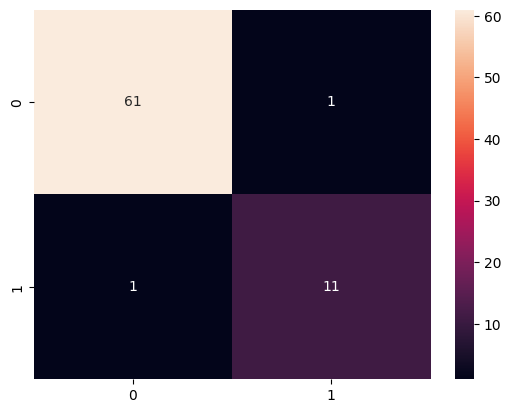

In [37]:
sns.heatmap(data=metrics.confusion_matrix(y_test, y_pred), annot=True)
plt.show()

In [38]:
from sklearn.neighbors import KNeighborsClassifier as KNNC

In [39]:
Pipeline_knn = Pipeline([
    ('scaler', StandardScaler()),
    ('model', KNNC(n_neighbors=3))
])

In [40]:
Pipeline_knn.fit(x_train, y_train.ravel())

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"classes_ classes_: ndarray of shape (n_classes,)The classes labels. Only exist if the last step of the pipeline is aclassifier.","ndarray[bool](2,)","[False, True]"
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](15,)","['chol','stab.glu','hdl',...,'Bmi','gender_female','gender_male']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,15
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True


In [41]:
y_pred = Pipeline_knn.predict(x_test)

In [42]:
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.92      0.98      0.95        62
        True       0.88      0.58      0.70        12

    accuracy                           0.92        74
   macro avg       0.90      0.78      0.83        74
weighted avg       0.92      0.92      0.91        74



In [43]:
param_grid_knn = {
    'model__n_neighbors': range(3, 16, 2),
    'model__weights': ["distance", "uniform"],  
}

In [44]:
grid_search_knn = GridSearchCV(
    estimator=Pipeline_knn,
    param_grid=param_grid_knn,
    cv=5,
    scoring="f1",
    n_jobs=-1,
    verbose=1,
)

In [45]:
grid_search_knn.fit(x_train, y_train.ravel())

Fitting 5 folds for each of 14 candidates, totalling 70 fits


,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Pipeline(step...eighbors=3))])
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'model__n_neighbors': range(3, 16, 2), 'model__weights': ['distance', 'uniform']}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion <scoring_api_overview>` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'f1'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary <n_jobs>`for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",-1
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- an iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide <cross_validation>` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",5
,"verbose verbose: int, default=0Controls the verbosity of information printed during fitting, with highervalues yielding more detailed logging.- 0 : no messages are printed;- >=1 : summary of the total number of fits;- >=2 : computation time for each fold and parameter candidate;- >=3 : fold indices and scores;- >=10 : parameter candidate indices and START messages before each fit.",1
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_plot_grid_search_digit

In [46]:
grid_search_knn.best_params_

{'model__n_neighbors': 3, 'model__weights': 'distance'}

In [47]:
grid_search_knn.best_score_

np.float64(0.7455882352941177)

In [48]:
results_df = pd.DataFrame(grid_search_knn.cv_results_)

In [49]:
results_df[["params", "mean_test_score", "std_test_score"]]

,params,mean_test_score,std_test_score
0,"{'model__n_neighbors': 3, 'model__weights': 'd...",0.745588,0.134750
1,"{'model__n_neighbors': 3, 'model__weights': 'u...",0.745588,0.134750
2,"{'model__n_neighbors': 5, 'model__weights': 'd...",0.690133,0.203206
3,"{'model__n_neighbors': 5, 'model__weights': 'u...",0.690133,0.203206
4,"{'model__n_neighbors': 7, 'model__weights': 'd...",0.680556,0.185924
5,"{'model__n_neighbors': 7, 'model__weights': 'u...",0.680556,0.185924
6,"{'model__n_neighbors': 9, 'model__weights': 'd...",0.666176,0.180552
7,"{'model__n_neighbors': 9, 'model__weights': 'u...",0.666176,0.180552
8,"{'model__n_neighbors': 11, 'model__weights': '...",0.656103,0.138225
9,"{'model__n_neighbors': 11, 'model__weights': '...",0.639927,0.136170


In [50]:
best_model = grid_search_knn.best_estimator_

In [51]:
y_pred = best_model.predict(x_test)

In [52]:
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.92      0.98      0.95        62
        True       0.88      0.58      0.70        12

    accuracy                           0.92        74
   macro avg       0.90      0.78      0.83        74
weighted avg       0.92      0.92      0.91        74



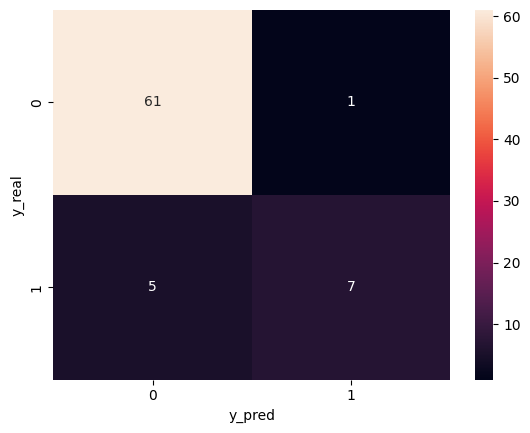

In [53]:
sns.heatmap(data=metrics.confusion_matrix(y_test, y_pred), annot=True)
plt.xlabel("y_pred")
plt.ylabel("y_real")
plt.show()

In [54]:
score_model.loc["KNeighbors", "accuracy"] = metrics.accuracy_score(y_test, y_pred)
score_model.loc["KNeighbors", "precision"] = metrics.precision_score(y_test, y_pred)
score_model.loc["KNeighbors", "recall"] = metrics.recall_score(y_test, y_pred)
score_model.loc["KNeighbors", "f1-score"] = metrics.f1_score(y_test, y_pred)

In [55]:
from sklearn.tree import DecisionTreeClassifier as DTS

In [56]:
Pipeline_dts = Pipeline([
    ('scaler', StandardScaler()),
    ('model', DTS(random_state=42, class_weight="balanced"))
])

In [57]:
Pipeline_dts.fit(x_train, y_train.ravel())

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"classes_ classes_: ndarray of shape (n_classes,)The classes labels. Only exist if the last step of the pipeline is aclassifier.","ndarray[bool](2,)","[False, True]"
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](15,)","['chol','stab.glu','hdl',...,'Bmi','gender_female','gender_male']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,15
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True


In [58]:
y_pred = Pipeline_dts.predict(x_test)

In [59]:
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.98      1.00      0.99        62
        True       1.00      0.92      0.96        12

    accuracy                           0.99        74
   macro avg       0.99      0.96      0.97        74
weighted avg       0.99      0.99      0.99        74



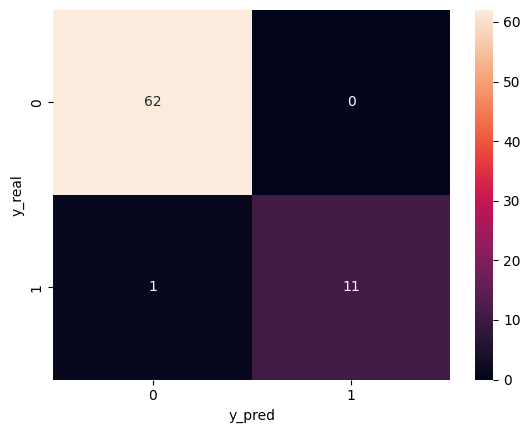

In [60]:
sns.heatmap(data=metrics.confusion_matrix(y_test, y_pred), annot=True)
plt.xlabel("y_pred")
plt.ylabel("y_real")
plt.show()

In [61]:
param_grid_dts = {
    "model__max_depth": range(2, 9),
    "model__min_samples_split": [2, 5, 10],
    "model__criterion": ["gini", "entropy"],
}

In [62]:
grid_search_dts = GridSearchCV(
    estimator=Pipeline_dts,
    param_grid=param_grid_dts,
    cv=5,
    scoring="f1",
    n_jobs=-1,
    verbose=1,
)

In [63]:
grid_search_dts.fit(x_train, y_train.ravel())

Fitting 5 folds for each of 42 candidates, totalling 210 fits


,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Pipeline(step...m_state=42))])
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'model__criterion': ['gini', 'entropy'], 'model__max_depth': range(2, 9), 'model__min_samples_split': [2, 5, ...]}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion <scoring_api_overview>` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'f1'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary <n_jobs>`for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",-1
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- an iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide <cross_validation>` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",5
,"verbose verbose: int, default=0Controls the verbosity of information printed during fitting, with highervalues yielding more detailed logging.- 0 : no messages are printed;- >=1 : summary of the total number of fits;- >=2 : computation time for each fold and parameter candidate;- >=3 : fold indices and scores;- >=10 : parameter candidate indices and START messages before each fit.",1
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model

In [64]:
grid_search_dts.best_params_

{'model__criterion': 'gini',
 'model__max_depth': 2,
 'model__min_samples_split': 2}

In [65]:
best_model = grid_search_dts.best_estimator_

In [66]:
y_pred = best_model.predict(x_test)

In [67]:
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.98      1.00      0.99        62
        True       1.00      0.92      0.96        12

    accuracy                           0.99        74
   macro avg       0.99      0.96      0.97        74
weighted avg       0.99      0.99      0.99        74



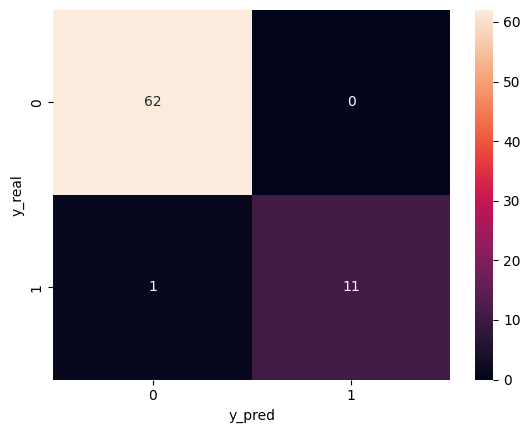

In [68]:
sns.heatmap(data=metrics.confusion_matrix(y_test, y_pred), annot=True)
plt.xlabel("y_pred")
plt.ylabel("y_real")
plt.show()

In [69]:
score_model.loc["DecisionTree", "accuracy"] = metrics.accuracy_score(y_test, y_pred)
score_model.loc["DecisionTree", "precision"] = metrics.precision_score(y_test, y_pred)
score_model.loc["DecisionTree", "recall"] = metrics.recall_score(y_test, y_pred)
score_model.loc["DecisionTree", "f1-score"] = metrics.f1_score(y_test, y_pred)

In [70]:
from sklearn.tree import plot_tree

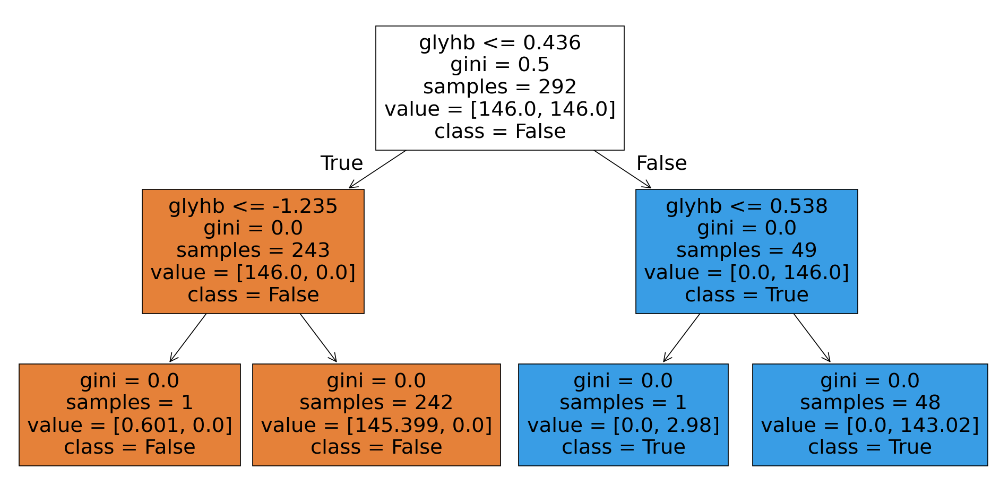

In [71]:
plt.figure(figsize=(20, 10), dpi=120)
plot_tree(
    Pipeline_dts["model"],
    filled=True,
    feature_names=df.drop(columns="Diabetes").columns,
    class_names=["False", "True"]
)
plt.savefig("tree.png")
plt.show()

In [72]:
from sklearn.svm import SVC

In [73]:
Pipeline_svm = Pipeline([
    ('scaler', StandardScaler()),
    ('model', SVC(random_state=42, class_weight="balanced"))
])

In [74]:
Pipeline_svm.fit(x_train, y_train.ravel())

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('scaler', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"classes_ classes_: ndarray of shape (n_classes,)The classes labels. Only exist if the last step of the pipeline is aclassifier.","ndarray[bool](2,)","[False, True]"
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](15,)","['chol','stab.glu','hdl',...,'Bmi','gender_female','gender_male']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,15
,"copy copy: bool, default=TrueIf False, try to avoid a copy and do inplace scaling instead.This is not guaranteed to always work inplace; e.g. if the data isnot a NumPy array or scipy.sparse CSR matrix, a copy may still bereturned.",True
,"with_mean with_mean: bool, default=TrueIf True, center the data before scaling.This does not work (and will raise an exception) when attempted onsparse matrices, because centering them entails building a densematrix which in common use cases is likely to be too large to fit inmemory.",True
,"with_std with_std: bool, default=TrueIf True, scale the data to unit variance (or equivalently,unit standard deviation).",True


In [75]:
y_pred = Pipeline_svm.predict(x_test)

In [76]:
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.97      0.98      0.98        62
        True       0.91      0.83      0.87        12

    accuracy                           0.96        74
   macro avg       0.94      0.91      0.92        74
weighted avg       0.96      0.96      0.96        74



In [77]:
param_grid_svm = {
    "model__C": [0.001,0.01, 0.1, 2],
    "model__kernel": ["linear", "poly", "rbf", "sigmoid"],
    "model__degree": [2, 3, 4]
}

In [78]:
grid_search_svm = GridSearchCV(
    estimator=Pipeline_svm,
    param_grid=param_grid_svm,
    cv=5,
    scoring="f1",
    n_jobs=-1,
    verbose=1,
)

In [79]:
grid_search_svm.fit(x_train, y_train.ravel())

Fitting 5 folds for each of 48 candidates, totalling 240 fits


,"estimator estimator: estimator objectThis is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Pipeline(step...m_state=42))])
,"param_grid param_grid: dict or list of dictionariesDictionary with parameters names (`str`) as keys and lists ofparameter settings to try as values, or a list of suchdictionaries, in which case the grids spanned by each dictionaryin the list are explored. This enables searching over any sequenceof parameter settings.","{'model__C': [0.001, 0.01, ...], 'model__degree': [2, 3, ...], 'model__kernel': ['linear', 'poly', ...]}"
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion <scoring_api_overview>` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.",'f1'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary <n_jobs>`for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",-1
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- an iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide <cross_validation>` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.",5
,"verbose verbose: int, default=0Controls the verbosity of information printed during fitting, with highervalues yielding more detailed logging.- 0 : no messages are printed;- >=1 : summary of the total number of fits;- >=2 : computation time for each fold and parameter candidate;- >=3 : fold indices and scores;- >=10 : parameter candidate indices and START messages before each fit.",1
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``GridSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`sphx_glr_auto_examples_model_selection_

In [80]:
grid_search_svm.best_params_

{'model__C': 2, 'model__degree': 2, 'model__kernel': 'linear'}

In [81]:
best_model = grid_search_svm.best_estimator_

In [82]:
y_pred = best_model.predict(x_test)

In [83]:
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.98      0.98      0.98        62
        True       0.92      0.92      0.92        12

    accuracy                           0.97        74
   macro avg       0.95      0.95      0.95        74
weighted avg       0.97      0.97      0.97        74



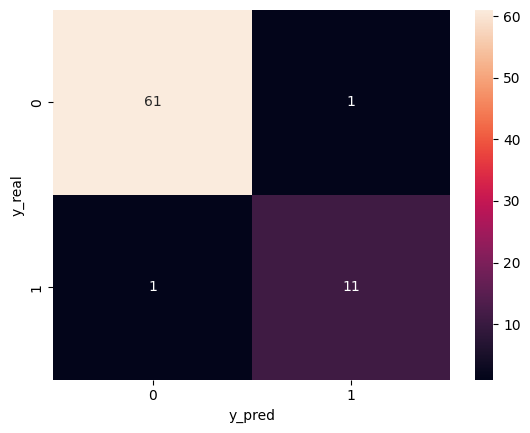

In [84]:
sns.heatmap(data=metrics.confusion_matrix(y_test, y_pred), annot=True)
plt.xlabel("y_pred")
plt.ylabel("y_real")
plt.show()

In [85]:
score_model.loc["SVC", "accuracy"] = metrics.accuracy_score(y_test, y_pred)
score_model.loc["SVC", "precision"] = metrics.precision_score(y_test, y_pred)
score_model.loc["SVC", "recall"] = metrics.recall_score(y_test, y_pred)
score_model.loc["SVC", "f1-score"] = metrics.f1_score(y_test, y_pred)

In [86]:
score_model

,accuracy,precision,recall,f1-score
logestic,0.972973,0.916667,0.916667,0.916667
KNeighbors,0.918919,0.875,0.583333,0.7
DecisionTree,0.986486,1.0,0.916667,0.956522
SVC,0.972973,0.916667,0.916667,0.916667


In [87]:
import joblib

In [88]:
joblib.dump(Pipeline_svm, 'my_model.joblib')

['my_model.joblib']